In [1]:
from moire.lattice import Lattice, Bilayer, Supercell
import numpy as np

In [2]:
m, n = 2, 1
Δz = 2
my_lat = Lattice(2.45951214)
C_dic = dict(name='C', color='blue', key='1A', draw_radius=50,pseudo_potential='C.pbe-n-kjpaw_psl.1.0.0.UPF', weight=12.0107)
my_lat.set_atom(np.array((0, 0, 0)), C_dic)
C_dic['color'] = 'lightblue'
C_dic['key'] = '1B'
my_lat.set_atom(np.array([0, 1.42, 0]), C_dic)
layer_1 = Supercell(my_lat, m , n)
C_dic['color'] = 'red'
C_dic['key'] = '2A'
lattice_2 = Lattice(2.45951214)
lattice_2.set_atom(np.array([0, 0, Δz]), C_dic)
C_dic['color'] = 'firebrick'
C_dic['key'] = '2B'
lattice_2.set_atom(np.array([0, 1.42, Δz]), C_dic)
layer_2 = Supercell(lattice_2, n, m)
my_lattice = Bilayer(layer_1, layer_2)


In [4]:
my_lattice.plot(3.5, 2, D=2, plot_3d=False, all=dict(showlegend=True))

In [4]:
from moire.dft import DFT
qe_dic = {
            '&CONTROL': {
                'pseudo_dir': '/home/hidde/hidde/Unige/dft/pseudo/'
            },
            '&SYSTEM': {
                'occupations': 'smearing',
                'smearing': 'mv',
                'degauss': 0.015,  
                'ecutwfc': 45,
                'ecutrho': 180,
                'nbnd': 30
            }
        }

data_dir = '/home/hidde/hidde/Unige/dft/graphene2'
graphene = DFT('graphene', data_dir, data_dir)
graphene.prepare_qe(qe_dic)
graphene.import_lattice(my_lat)
graphene.set_k_grid(8)
graphene.set_k_path([(0, 0, 0), (0.5, 0, 0), (1/3, 1/3, 0), (0, 0, 0)], ["Γ", "M", "K", "Γ"], 100)

In [5]:
graphene.extract_nscf()

In [6]:
graphene.plot_nscf()
graphene.band_plot.fig

In [7]:
graphene.write_qe('nscf')

In [8]:
graphene.run_qe('nscf')

nscf 0
0:00:47.239939


In [9]:
from moire.dft import DFT
data_dir = '/home/hidde/hidde/Unige/dft/twb21'
tb = DFT('tbwse2_21', data_dir, data_dir)
qe_dic = {}
tb.prepare_qe(qe_dic)
tb.set_k_path([(0, 0, 0), (0.5, 0, 0), (1/3, 1/3, 0), (0, 0, 0)], ["Γ", "M", "K", "Γ"], 100)
tb.extract_nscf()
tb.plot_nscf()
tb.band_plot.fig


In [10]:
32032/81

395.4567901234568

In [ ]:
print(*a)

In [ ]:
2.95+3.6+2.7+3.9+5.9+1+0.95+2.9+2.95+0.25+3.9+2.95+3.6

In [ ]:
5.65+7.95

In [ ]:
3.5/2 + 5.2+1.8+2+1.35+0.9

In [ ]:
import numpy as np
a = np.array([[0, 1], [1, 2]])
np.tile(a, (3, 3))

In [ ]:
type([])

In [ ]:
plop = dict(hoi=4, boi=4)
print(plop)

print(keys)
for key in keys:
    print(key)
    plop['pop/'+key] = plop.pop(key)

plop

In [ ]:
nscf_data = np.tile(np.load(self.prefix+'/qe_nscf.npy'), (3, 3, 1))
x = np.linspace(-1, 2, len(nscf_data))
bands = np.zeros((len(self.band_plot.k_path), nscf_data.shape[2]))
k_x, k_y, k_z = np.transpose(self.band_plot.k_path)
for i in range(nscf_data.shape[2]):
    f_interpolation = RectBivariateSpline(x, x, nscf_data[:, :, i])
    bands[:, i] = f_interpolation(k_x, k_y, grid=False)

In [ ]:
def f(**kwargs):
    if 'hoi' in kwargs:
        kwargs.pop('hoi')
    return kwargs

f(hoi=3, bop=2)

In [ ]:
f(**{'hoi': 1})

In [ ]:
len(1)

In [ ]:
for i in range(3):
    a = 4
print(a)

In [ ]:
import plotly.graph_objects as go
import numpy as np

# Create figure
fig = go.Figure()

# Add traces, one for each slider step
for step in np.arange(0, 5, 0.1):
    fig.add_trace(
        go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=np.sin(step * np.arange(0, 10, 0.01))))

# Make 10th trace visible
fig.data[10].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Slider switched to step: " + str(i)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 50},
    steps=steps,
    y=0
)]

fig.update_layout(
    sliders=sliders
)

fig.show()

In [26]:
from moire.dft import plot
import numpy as np
import plotly.graph_objects as go

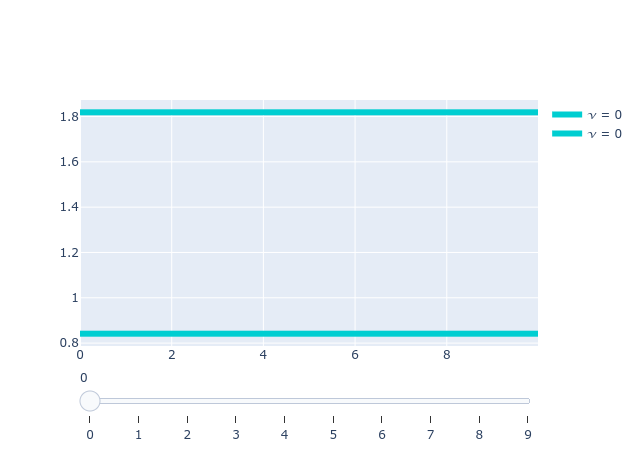

In [36]:
def my_plot(func):
    decorators = [plot.slider, plot.legend]
    for decorator in reversed(decorators):
        func = decorator(func)
    return func
    
@my_plot
def f(step=1, scale=1, **kwargs):
    return go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=scale*np.sin(scale+step * np.arange(0, 10, 0.01)))

traces = f(slider=dict(args=dict(step=range(10))), legend=dict(args=dict(scale=[1, 2])))
traces


In [ ]:
def f(step=1, **kwargs):
    return go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=np.sin(step * np.arange(0, 10, 0.01)))
step = 1
fig = go.Figure(data=go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=np.sin(step * np.arange(0, 10, 0.01))))
fig.show()

In [ ]:
import numpy as np
np.sign(-1) * np.sign(1) >= 0

In [ ]:
def m_l(j, m_j):
    return int(m_j - np.sign((j-2)*m_j) / 2)

m_l(1.5, -1.5)

In [ ]:
-0 == 0

In [ ]:
from scipy.interpolate import griddata

points = ((0, 0), (1, 0), (1, 1), (0, 1))
values = np.array(((0, 1), (0, 2), (1, 1), (1, 2)))
for value in values:
    f_inter = RectBivariateSpline([0, 1], [0 1], values) 

from moire.dft import DFT
data_dir = '/home/hidde/hidde/Unige/dft/twb_21'
tb = DFT('tbwse2_21', data_dir, data_dir)
qe_dic = {}
#tb.extract_projwfc()


In [8]:
import numpy as np
layer_1 = [i for i in range(7)] + [14 + i for i in range(14)]
layer_2 = [7 + i for i in range(7)] + [28 + i for i in range(14)]
orb_args = dict(orbital=[dict(l=2, m_l=2), dict(l=2, m_l=1), dict(l=2, m_l=0), dict(l=1), dict(l=0)])
elem_args = dict(elements=[dict(atoms=layer, m_s=m_s) for layer in [layer_1, layer_2] for m_s in [-0.5, 0.5]])
legend_tags = ['layer '+str(i)+' '+σ for i in [1, 2] for σ in ['↓', '↑']]
tb.plot_wfc(ε_range=[-5.5, -3], k_tags=['Γ', 'K', 'M', 'Γ'], k_list=[np.array([0, 0]), np.array([4*np.pi/3, 0]), np.array([np.pi, np.pi/np.sqrt(3)]), np.zeros(2)], N_k=101, cut=-4, legend=dict(args=elem_args, tags=legend_tags, auto_color=True), slider=dict(args=orb_args, tags=['d_xy/d_x2y2', 'dxz/dyz', 'dz2', 'p', 's'], prefix='orbital'), size=30)

In [6]:
print(elem_args)

{'elements': [{'atoms': [0, 1, 2, 3, 4, 5, 6, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27], 'm_s': -0.5}, {'atoms': [0, 1, 2, 3, 4, 5, 6, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27], 'm_s': 0.5}, {'atoms': [7, 8, 9, 10, 11, 12, 13, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41], 'm_s': -0.5}, {'atoms': [7, 8, 9, 10, 11, 12, 13, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41], 'm_s': 0.5}]}


In [1]:
from moire.plot import Orbital, BandStructure
import numpy as np

wse2_var_dic = {
        "t_1": 0.034, 
        "t_2": 0.263, 
        "t_3": nm jmn -0.207, 
        "t_12": 0.329, 
        "t_13": 0.486, 
        "t_23": 0.457, 
        "ε_1": 2.179, 
        "ε_3": 0.942, 
        "λ_SOC": 0.228
    }

def H_mono(k, σ=0, **kwargs):
    t_1, t_2, t_3, t_12, t_13, t_23, ε_1, ε_3, λ_SOC = wse2_var_dic.values()
    k_x, k_y = k[0]/2, k[1]*np.sqrt(3)/2
    cos2x, cosx, cosy = np.cos(2*k_x), np.cos(k_x), np.cos(k_y)
    sin2x, sinx, siny = np.sin(2*k_x), np.sin(k_x), np.sin(k_y)
    h_1 = 2*t_1*cos2x + (t_1+3*t_2)*cosx*cosy
    h_2 = 2*t_2*cos2x + (t_2+3*t_1)*cosx*cosy
    h_3 = 2*t_3*cos2x + 4*t_3*cosx*cosy
    h_12 = np.sqrt(3)*(t_1-t_2)*sinx*siny + 2j*t_12*(sin2x-2*sinx*cosy)
    h_13 = 2*t_13*(cos2x-cosx*cosy) + 2j*np.sqrt(3)*t_23*cosx*siny
    h_23 = -2*np.sqrt(3)*t_13*sinx*siny + 2j*t_23*(sin2x+sinx*cosy)
    return np.array([
            [ε_1+h_1, 1j*λ_SOC*σ+h_12, h_13],
            [-1j*λ_SOC*σ+np.conj(h_12), ε_1+h_2, h_23],
            [np.conj(h_13), np.conj(h_23), ε_3+h_3]
        ])

bandstructure = BandStructure()
bandstructure.set_k_path([np.array([0, 0]), np.array([4*np.pi/3, 0]), np.array([np.pi, np.pi/np.sqrt(3)]), np.zeros(2)], 
          [r'$\Gamma$', 'K', 'M', r'$\Gamma$'], 300)
legend = dict(
    args=dict(H=[(lambda k, σ=σ: H_mono(k, σ=σ)) for σ in [0, 1, -1]]), 
    tags=['spinless', 'σ: 1/2', 'σ: -1/2'])
bandstructure.plot_from_H(legend=legend)

bandstructure.fig

ValueError: could not broadcast input array from shape (3) into shape (299)

In [28]:
a = dict(H=[(lambda k, σ=σ: H_mono(k, σ=σ)) for σ in [0, 1, -1]])
a['H'][1]((0, 0))

1


array([[ 3.07+0.j   ,  0.  +0.228j,  0.  +0.j   ],
       [ 0.  -0.228j,  3.07+0.j   ,  0.  +0.j   ],
       [ 0.  -0.j   ,  0.  -0.j   , -0.3 +0.j   ]])

In [26]:
f_lst = []
for i in range(3):
    def f(x, i=i):
        return x+i
    f_lst.append(f)

In [27]:
f_lst[0](1)

1

In [15]:

import numpy as np
a = [1, -2]
b = [1, 0]
with np.errstate(divide='ignore'):
    print(np.abs(np.array(a)/b) > 2)

[False  True]
